In [1]:
import selenium
import pandas as pd
from selenium import webdriver
import warnings
import requests
warnings.filterwarnings('ignore')
from selenium.common.exceptions import StaleElementReferenceException, NoSuchElementException
from selenium.common.exceptions import TimeoutException, ElementClickInterceptedException
from selenium.webdriver.common.by import By

from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.action_chains import ActionChains
from selenium.webdriver.chrome.service import Service



import time
from time import sleep

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/b7e2dd886cc65e76ac4087e5d6d3f86d/v0/medium/1_bhk_apartment-for-rent-colaba-Mumbai-bedroom.jpg" as="image"/><link rel="preload" href="
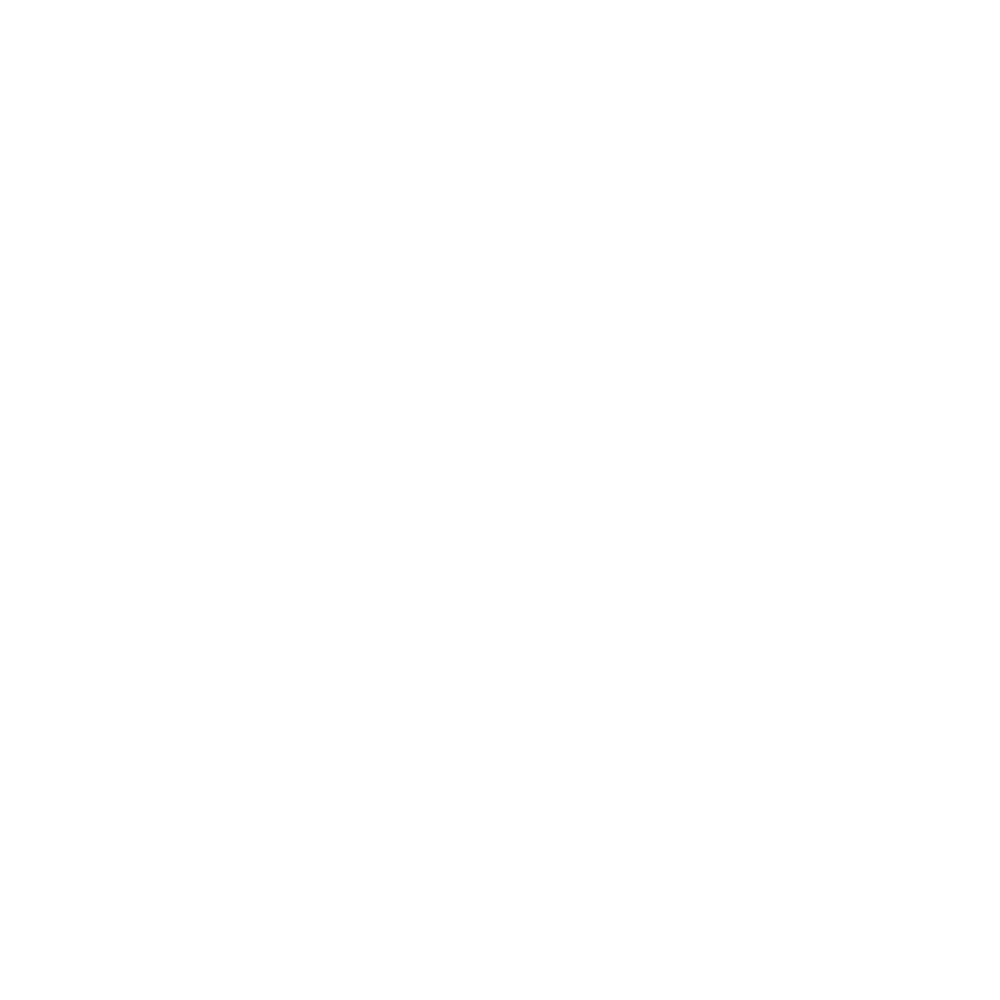

In [13]:
url = 'https://housing.com/rent/flats-for-rent-in-mumbai-maharashtra-Pskwz0ocdh7q42r5'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [14]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [5]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [6]:
# Scrapping urls of all products
url_list = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list.append(i.get_attribute("href"))  
    time.sleep(5)

In [11]:
len(url_list)

330

In [15]:
address = []
city = []
project_name = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [16]:
df1 = pd.DataFrame({
    "Project Name" : project_name,
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df1)
print("data scrapping complete")

                      Project Name  \
0                      Kuvar House   
1                         2.5 Lacs   
2                         4.5 Lacs   
3                         4.5 Lacs   
4    Lokhandwala Minerva Mahalaxmi   
..                             ...   
325                       2.0 Lacs   
326                       4.5 Lacs   
327                       2.0 Lacs   
328                         40,000   
329                       3.0 Lacs   

                                               Address    City Rental Price  \
0             Kuvar House , Azad Nagar, Colaba, Mumbai  Mumbai     1,00,000   
1    Sethia Grandeur, Siddharth Nagar, Bandra East,...  Mumbai       85,000   
2    Pebbles Marina Apartments, Juhu Koliwada, Khar...  Mumbai     1,50,000   
3          Lodha Venezia, Krishna Nagar, Parel, Mumbai  Mumbai     1,50,000   
4    Lokhandwala Minerva Mahalaxmi, Royal Western I...  Mumbai     2,40,000   
..                                                 ...     ...       

In [24]:
df1.to_csv("df1.csv",index=False)

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/7e55342a84c62f521c0281baa96cd706/v0/medium/2_bhk_apartment-for-rent-krishnarajapura_bangalore_1-Bangalore-kitchen.jpg" as="image"/><l
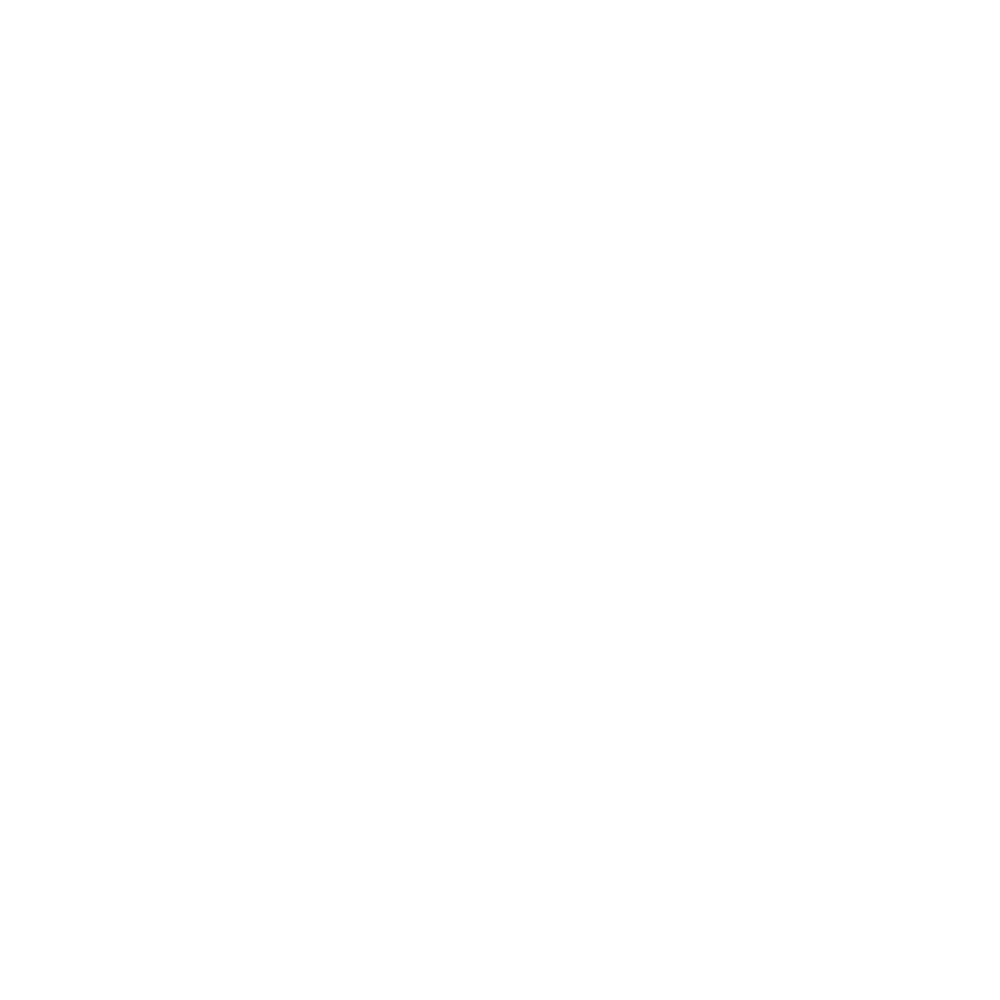

In [30]:
url = 'https://housing.com/rent/flats-for-rent-in-bangalore-karnataka-P38f9yfbk7p3m2h1f'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [31]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [32]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [33]:
# Scrapping urls of all products
url_list2 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list2.append(i.get_attribute("href"))  
    time.sleep(5)

In [34]:
len(url_list2)

330

In [35]:
address = []
city = []
project_name = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list2:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [36]:
df2 = pd.DataFrame({
    "Project Name" : project_name,
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df2)
print("data scrapping complete")
df2.to_csv("df2.csv",index=False)

    Project Name                                            Address  \
0           None  The Leela residency, Devin Paradise Enclave, T...   
1       1.5 Lacs  KR PURAM NEST, Kadugodi, Krishnarajapura, Bang...   
2       1.5 Lacs      Brigade Bricklane, Agrahara Layout, Bangalore   
3        1.0 Lac              Doddanekundi, Kartik Nagar, Bangalore   
4       3.0 Lacs  Prestige Falcon City, Anjanadri Layout, Konana...   
..           ...                                                ...   
325     6.0 Lacs  Advaitha Aksha, Jakkasandra Extension, Koraman...   
326       60,000  Only vegetarian family good location nice buil...   
327     2.5 Lacs                    Sector 1, HSR Layout, Bangalore   
328     2.0 Lacs  Prestige Willow Tree, Cholanayakanahalli, Hebb...   
329     4.0 Lacs  Mantri Serenity, Singapore Gardens And Green F...   

          City Rental Price No of Bathrooms  Area Cupboard        Balcony  \
0    Bangalore     1,60,001      No Balcony  1500        -  Available 

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/f43c282ec70367ae36e0e206c4d90ecc/v0/medium/1_bhk_apartment-for-rent-kondapur_hyderabad-Hyderabad-living_room.jpg" as="image"/><link r
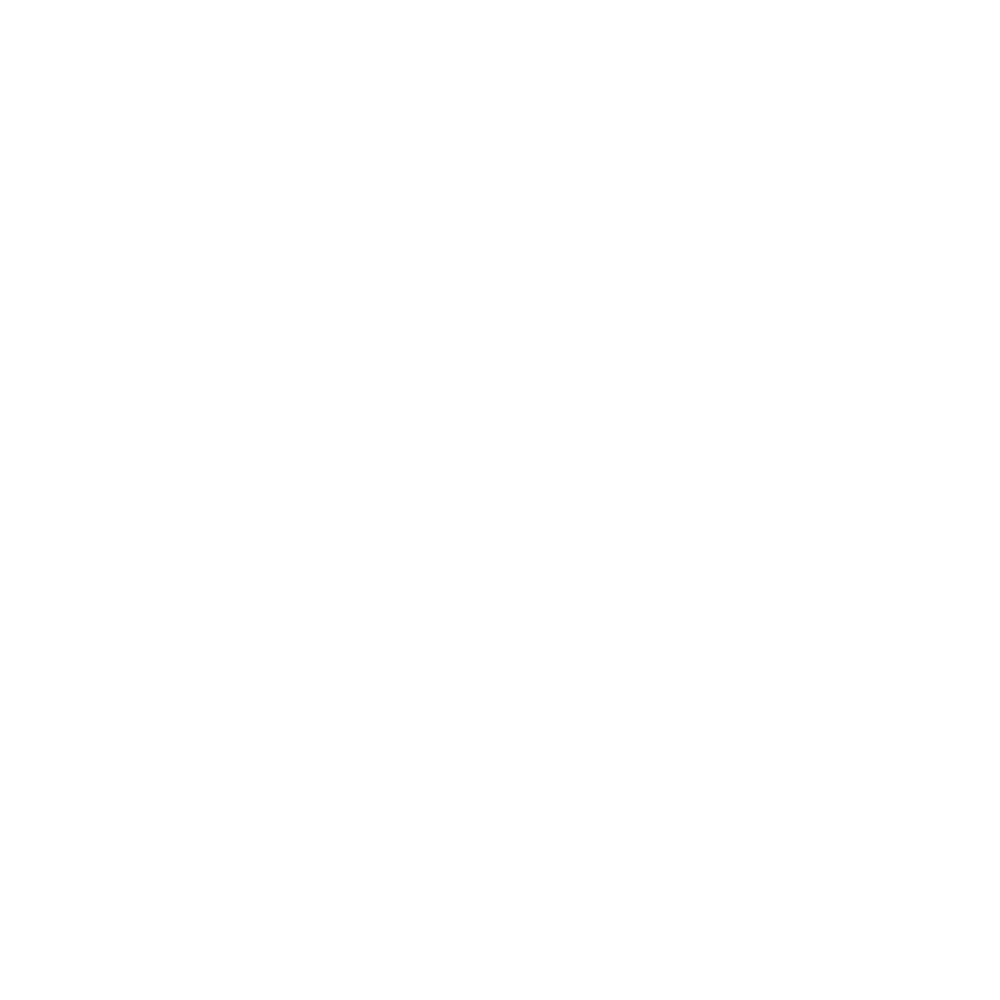

In [37]:
url = 'https://housing.com/rent/flats-for-rent-in-hyderabad-telangana-P679xe73u28050522'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [38]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [39]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [40]:
# Scrapping urls of all products
url_list3 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list3.append(i.get_attribute("href"))  
    time.sleep(5)

In [41]:
len(url_list3)

330

In [42]:
address = []
city = []
project_name = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list3:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [43]:
df3 = pd.DataFrame({
    "Project Name" : project_name,
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df3)
print("data scrapping complete")
df3.to_csv("df3.csv",index=False)

                        Project Name  \
0                             31,000   
1    Hyderabad Kondapur Masjid Banda   
2                           1.1 Lacs   
3                             92,000   
4                             38,000   
..                               ...   
325                           60,000   
326                         1.2 Lacs   
327                           70,000   
328                         1.2 Lacs   
329                           38,000   

                                               Address       City  \
0              Raghavendra Colony, Kondapur, Hyderabad  Hyderabad   
1    Hyderabad Kondapur Masjid Banda, Whitefields, ...  Hyderabad   
2         Prestige High Fields, Puppalaguda, Hyderabad  Hyderabad   
3                Patrika Nagar, Hitech City, Hyderabad  Hyderabad   
4    Un name, Rajarajeshwari Nagar, Kondapur, Hyder...  Hyderabad   
..                                                 ...        ...   
325                   Quadri Bagh, A

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/32ec54d3a0b51b317cfc1338b62a470f/v0/medium/3_bhk_apartment-for-rent-chokhi_dhani-Pune-hall.jpg" as="image"/><link rel="preload" href=
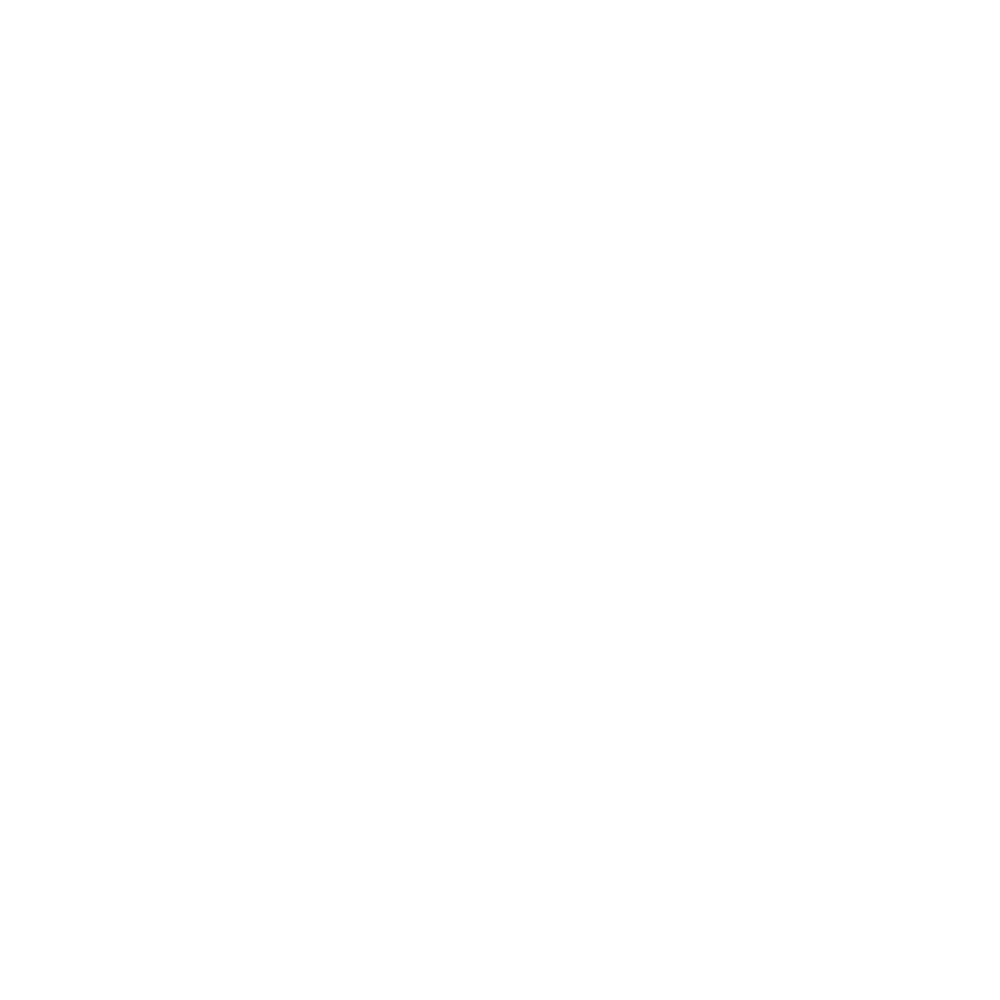

In [44]:
url = 'https://housing.com/rent/flats-for-rent-in-pune-maharashtra-P2r4v3l939lxd541t'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [45]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [46]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [47]:
# Scrapping urls of all products
url_list4 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list4.append(i.get_attribute("href"))  
    time.sleep(5)

In [48]:
len(url_list4)

328

In [49]:
address = []
city = []
project_name = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list4:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [50]:
df4 = pd.DataFrame({
    "Project Name" : project_name,
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df4)
print("data scrapping complete")
df4.to_csv("df4.csv",index=False)

    Project Name                                            Address  City  \
0         80,000  Vilas Yashwin Orizzonte Phase II, Chokhi Dhani...  Pune   
1         40,000                      Nirvana Lifecity, Dighi, Pune  Pune   
2       1.2 Lacs  Bramha Corp Sun City Phase 2, Digambar Nagar, ...  Pune   
3         64,000   Mahalaxmi Zen Estate, Thite Nagar, Kharadi, Pune  Pune   
4         70,000          Florida Water Color, Manjari Budruk, Pune  Pune   
..           ...                                                ...   ...   
323       45,000       Gera Park View, EON Free Zone, Kharadi, Pune  Pune   
324       30,000  Gera Shristi Kharadi, Rakshak Nagar, Kharadi, ...  Pune   
325       66,000  Amanora Adreno Towers, Amanora Park Town, Hada...  Pune   
326       90,000  Amanora Gold Towers 44 45 And 46, Amanora Park...  Pune   
327       60,000  Three Jewels, Tilekar Nagar, Kondhwa Budruk, Pune  Pune   

    Rental Price No of Bathrooms  Area Cupboard        Balcony Geyser Fridg

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/7d8e146670d160589cc7b144745ba125/v0/medium/4_bhk_apartment-for-rent-kilpauk-Chennai-hall.jpg" as="image"/><link rel="preload" href="h
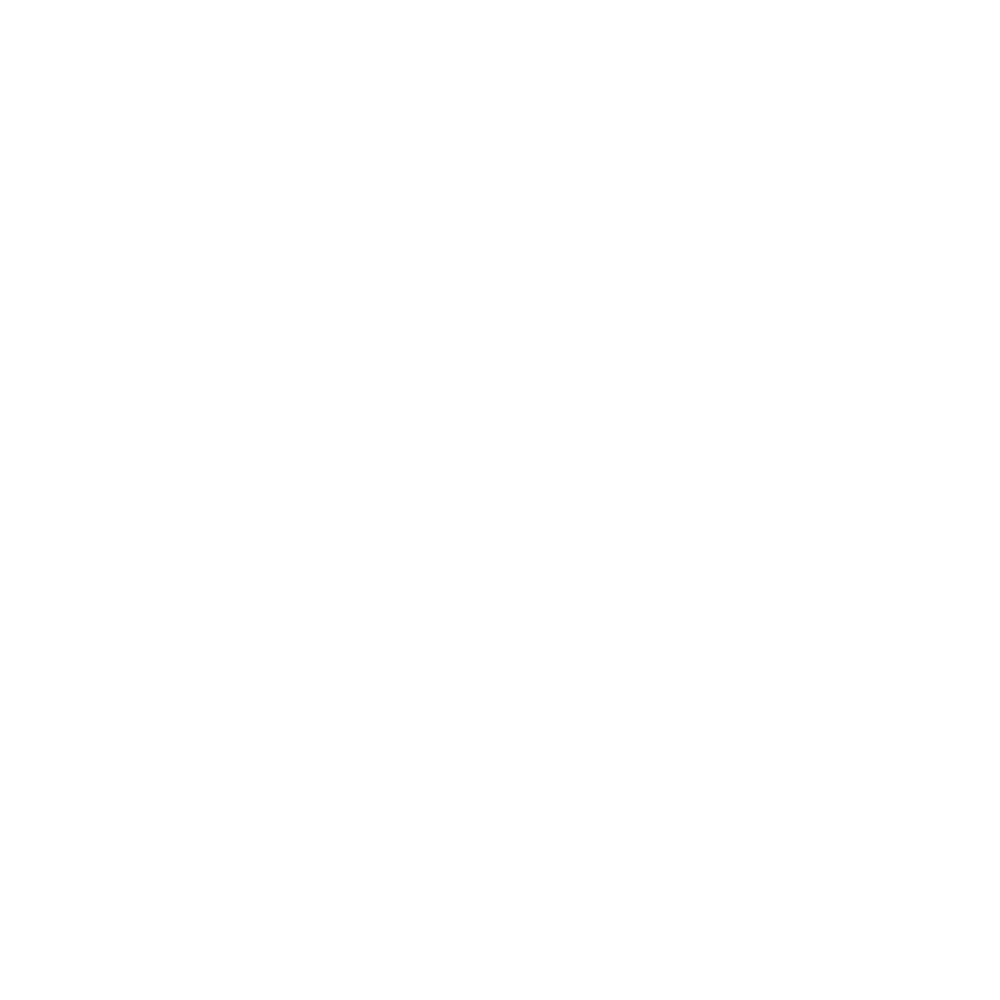

In [51]:
url = 'https://housing.com/rent/flats-for-rent-in-chennai-tamil-nadu-P4bimjmco2m9afw0m'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [52]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [53]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [54]:
# Scrapping urls of all products
url_list5 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list5.append(i.get_attribute("href"))  
    time.sleep(5)

In [55]:
len(url_list5)

328

In [56]:
address = []
city = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list5:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [57]:
df5 = pd.DataFrame({
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df5)
print("data scrapping complete")
df5.to_csv("df5.csv",index=False)

                                               Address     City Rental Price  \
0              Aspiran Garden Colony, Kilpauk, Chennai  Chennai     1,50,000   
1    Y.M.C.A Collage Of Physical Education, Nandana...  Chennai     1,10,000   
2                     Sri Ram Nagar, Alwarpet, Chennai  Chennai     2,50,000   
3                   Luxury Villa, Injambakkam, Chennai  Chennai     1,49,500   
4                   Luxury villa, Injambakkam, Chennai  Chennai     2,50,000   
..                                                 ...      ...          ...   
323      Vijay Shanthi Lotus Pond, Kalavakkam, Chennai  Chennai        6,000   
324                                                  -        -            -   
325                                Thiruporur, Chennai  Chennai       10,000   
326  CasaGrand Crescendo, Mel Ayanambakkam, Ambattu...  Chennai       32,000   
327               Railway Colony, Aminjikarai, Chennai  Chennai       16,000   

    No of Bathrooms  Area Cupboard     

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/1706527761391_9796118164b4e5dddf7047ab43217964/v0/medium/4_bhk_independent_builder_floor-for-rent-hauz_khas-New+Delhi-bedroom.jpg" as
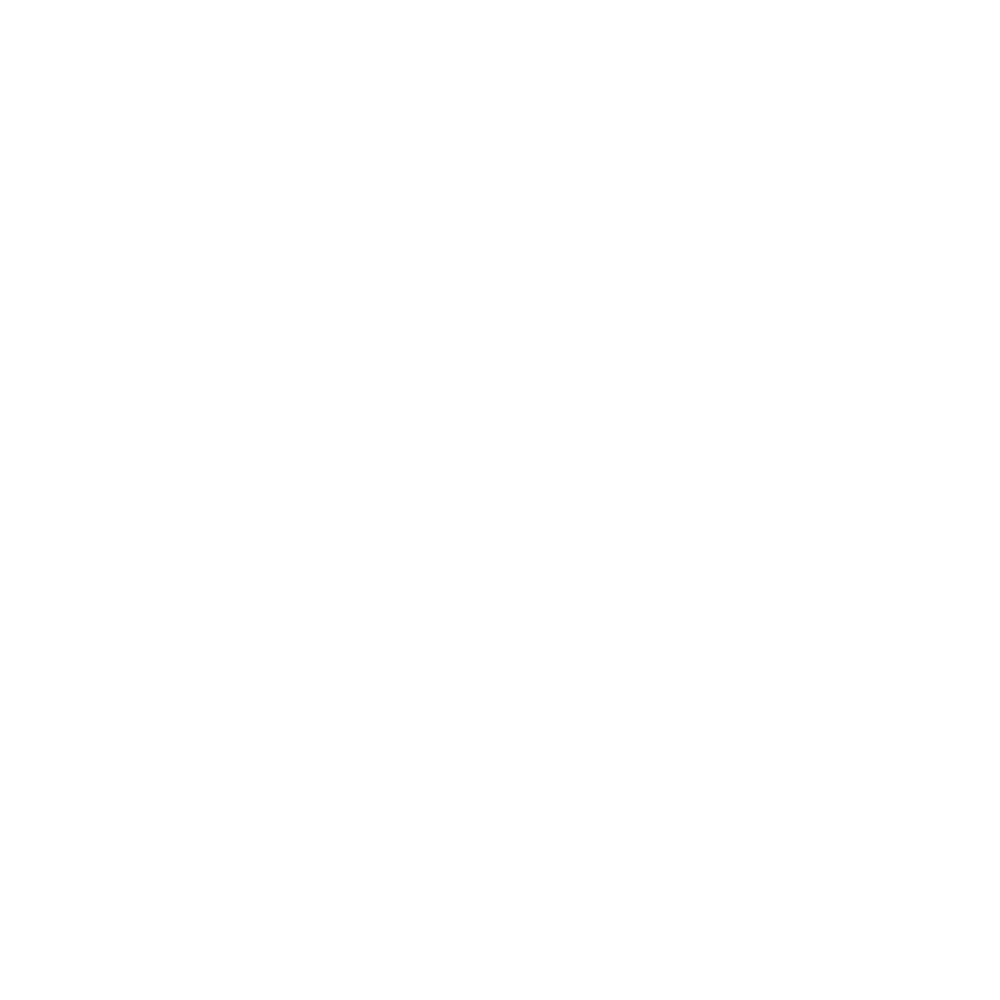

In [58]:
url = 'https://housing.com/rent/flats-for-rent-in-new-delhi-india-P6xfqdsey6cc3d95h'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [59]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [60]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [61]:
# Scrapping urls of all products
url_list6 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list6.append(i.get_attribute("href"))  
    time.sleep(5)

In [62]:
len(url_list6)

330

In [63]:
address = []
city = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list6:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [64]:
df6 = pd.DataFrame({
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df6)
print("data scrapping complete")
df6.to_csv("df6.csv",index=False)

                                               Address       City  \
0                      Deer Park, Hauz Khas, New Delhi  New Delhi   
1    DLF Capital Greens, Karampura Industrial Area,...  New Delhi   
2    DLF Capital Greens, Karampura Industrial Area,...  New Delhi   
3                              Lajpat Nagar, New Delhi  New Delhi   
4                 RBI colony, Paschim Vihar, New Delhi  New Delhi   
..                                                 ...        ...   
325                  Budh Nagar, Inder Puri, New Delhi  New Delhi   
326                    Govindpuri Extension, New Delhi  New Delhi   
327                        Sector 24 Rohini, New Delhi  New Delhi   
328                       Hari Nagar Ashram, New Delhi  New Delhi   
329                       Sector 23B Dwarka, New Delhi  New Delhi   

    Rental Price No of Bathrooms  Area Cupboard        Balcony Geyser Fridge  \
0       3,00,000               4  4500        -              4      -      -   
1         5

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/d219461d414d592fe2baa2a838d8f619/v0/medium/5_bhk_apartment-for-rent-sector_85_gurgaon-Gurgaon-living_room.jpg" as="image"/><link rel=
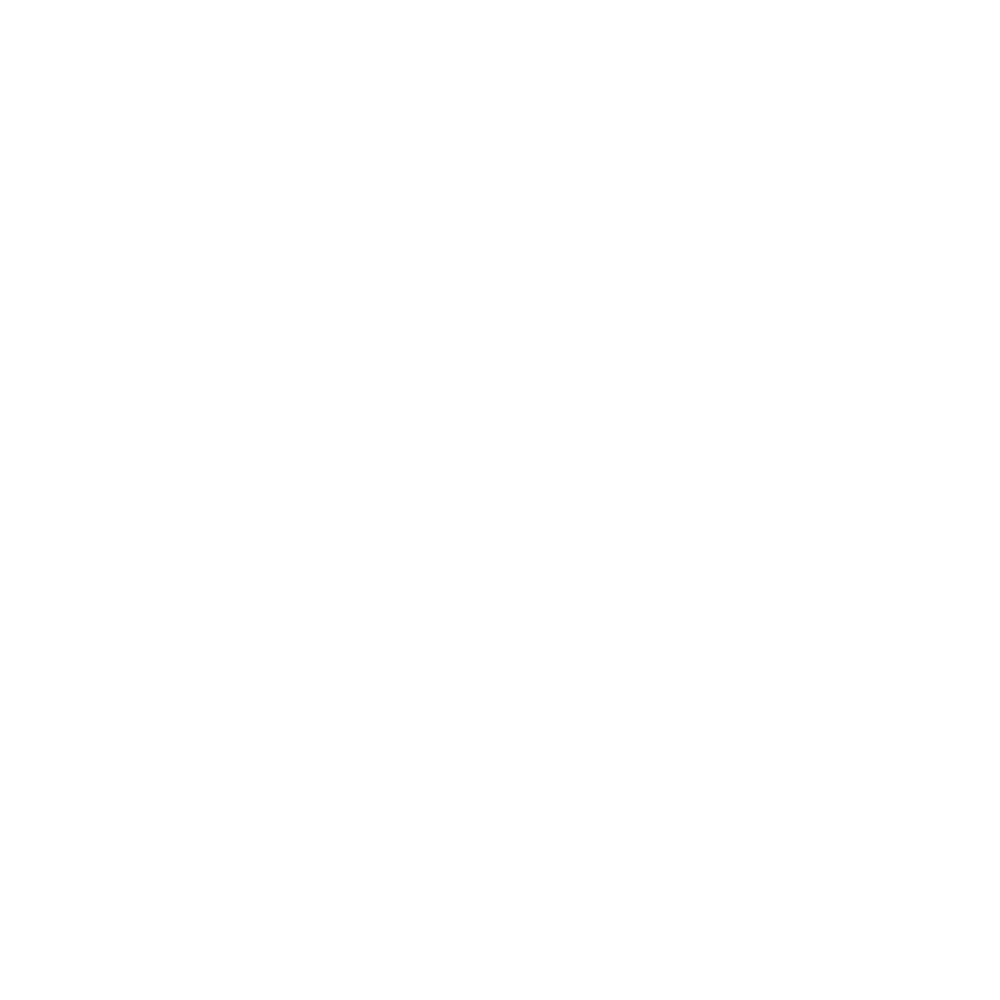

In [65]:
url = 'https://housing.com/rent/flats-for-rent-in-gurgaon-haryana-P1od1w26jrfqap1jl'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [66]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [67]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [68]:
# Scrapping urls of all products
url_list7 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list7.append(i.get_attribute("href"))  
    time.sleep(5)

In [69]:
len(url_list7)

300

In [70]:
address = []
city = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list7:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [71]:
df7 = pd.DataFrame({
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df7)
print("data scrapping complete")
df7.to_csv("df7.csv",index=False)

                                               Address     City Rental Price  \
0                      SS The Leaf, Sector 85, Gurgaon  Gurgaon       73,000   
1                Suncity Avenue 76, Sector 76, Gurgaon  Gurgaon       30,000   
2              Ramprastha Primera, Sector 37D, Gurgaon  Gurgaon       30,000   
3                      Ireo Uptown, Sector 66, Gurgaon  Gurgaon       55,000   
4                     Sector 26A, DLF Phase 1, Gurgaon  Gurgaon     1,60,000   
..                                                 ...      ...          ...   
295           Emaar Emerald Estate, Sector 65, Gurgaon  Gurgaon       45,000   
296  Sun Projects C-670 Sl-1, C Block, Sushant Lok ...  Gurgaon       21,000   
297  Paras Dews, Panwala Khusropur, Sector 106, Gur...  Gurgaon       32,000   
298  HUDA Plot Sector 43, C Block, Sushant Lok I, G...  Gurgaon       52,000   
299  DLF Independent Floor At DLF City Phase III, D...  Gurgaon     1,40,000   

    No of Bathrooms  Area Cupboard     

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/e971d1f4811d55e1da00628d960dd6db/v0/medium/3_bhk_apartment-for-rent-sector_78_noida-Noida-bedroom.jpg" as="image"/><link rel="preload
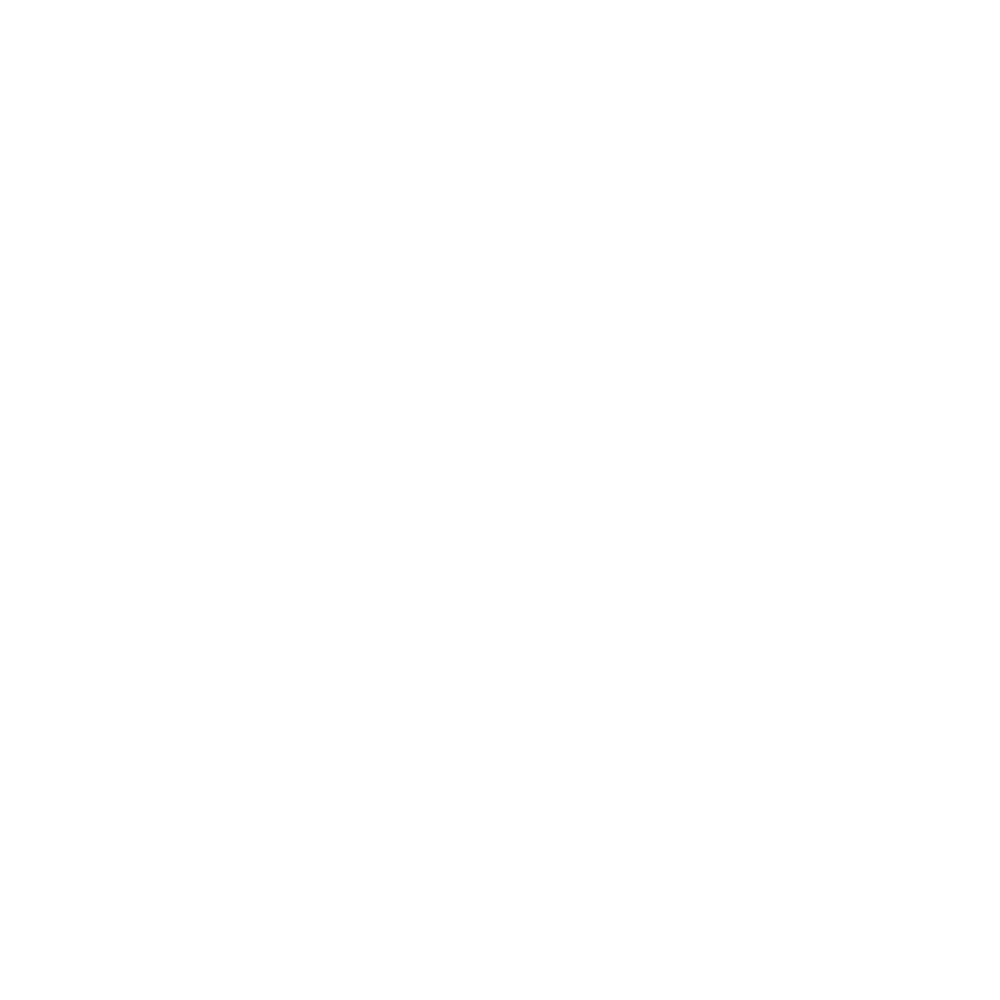

In [72]:
url = 'https://housing.com/rent/flats-for-rent-in-noida-uttar-pradesh-P2fqf0dypkiyhifgy'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [73]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [74]:
for _ in range(20):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [75]:
# Scrapping urls of all products
url_list8 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list8.append(i.get_attribute("href"))  
    time.sleep(5)

In [76]:
len(url_list8)

629

In [77]:
address = []
city = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list8:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [78]:
df8 = pd.DataFrame({
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df8)
print("data scrapping complete")
df8.to_csv("df8.csv",index=False)

                                               Address           City  \
0                   Mahagun Mezzaria, Sector 78, Noida          Noida   
1    ATS Happy Trails, Sector 10, Greater Noida Wes...  Greater Noida   
2                      Paras Tierea, Sector 137, Noida          Noida   
3    CRC Sublimis, Sector 1, Greater Noida West, No...  Greater Noida   
4                       Jaypee Aman, Sector 151, Noida          Noida   
..                                                 ...            ...   
624  Mahagun Mantraa, Sector 10, Greater Noida West...  Greater Noida   
625                   Jaypee Kosmos, Sector 134, Noida          Noida   
626                                   Sector 46, Noida          Noida   
627                                  Sector 128, Noida          Noida   
628  The 3C Lotus Panache, Lotus Panache, Sector 11...          Noida   

    Rental Price No of Bathrooms  Area Cupboard        Balcony Geyser Fridge  \
0         70,000               3  2500     

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/014b6bdb025adcc7fc665bd852740958/v0/medium/2_bhk_apartment-for-rent-bidhannagar-Kolkata-bedroom.jpg" as="image"/><link rel="preload" 
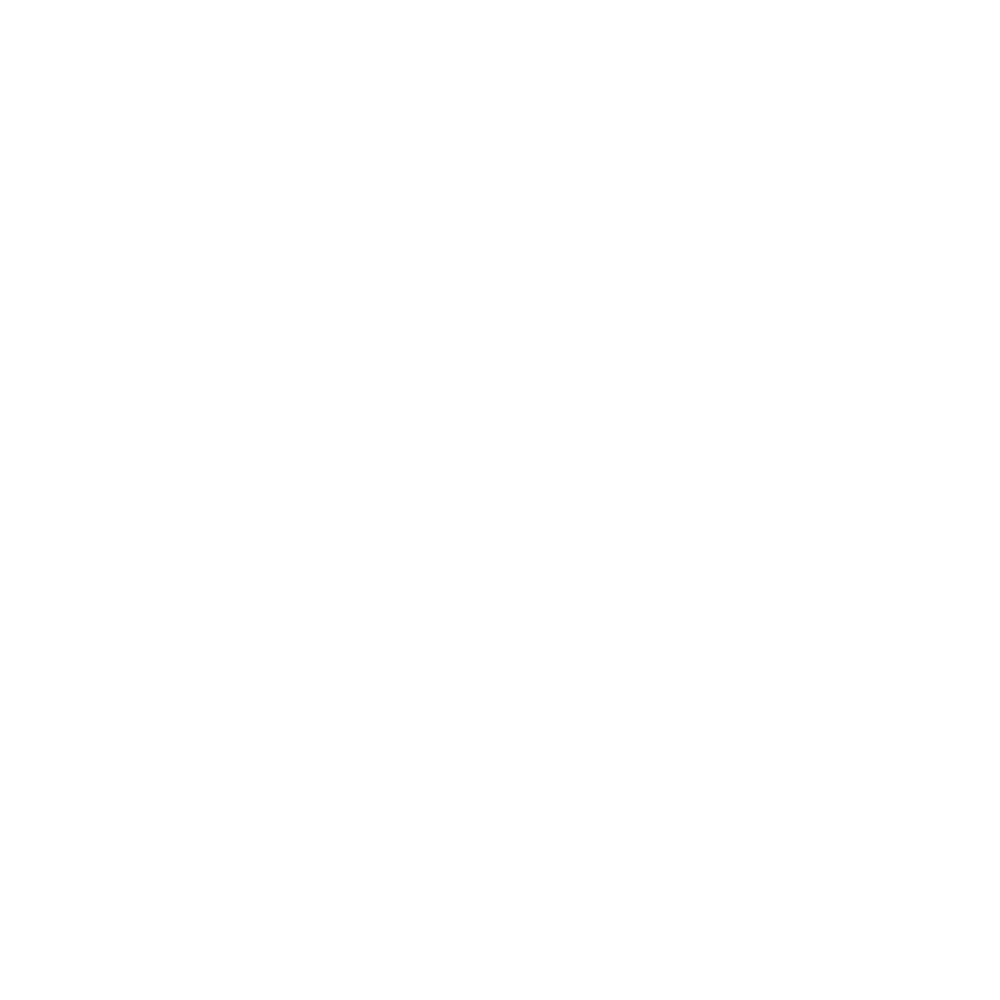

In [79]:
url = 'https://housing.com/rent/flats-for-rent-in-calcutta-west-bengal-P40qcmycif4m431jo'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [80]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [81]:
for _ in range(20):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [82]:
# Scrapping urls of all products
url_list9 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list9.append(i.get_attribute("href"))  
    time.sleep(5)

In [83]:
len(url_list9)

630

In [84]:
address = []
city = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list9:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [85]:
df9 = pd.DataFrame({
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df9)
print("data scrapping complete")
df9.to_csv("df9.csv",index=False)

                                               Address     City Rental Price  \
0    Merlin 5th Avenue, Mohisbathan, Salt Lake City...  Kolkata       30,000   
1       Ambuja Udita, Survey Park, Santoshpur, Kolkata  Kolkata       46,000   
2    South City Apartment, South City Complex, Jada...  Kolkata       50,000   
3                       Ghosh Para, Keshtopur, Kolkata  Kolkata        6,000   
4    Bengal Abasan Urban Sabujayan, Jagatipota, Kol...  Kolkata       30,000   
..                                                 ...      ...          ...   
625                          Noapara, Barasat, Kolkata  Kolkata        7,000   
626                       Kudghat, Tollygunge, Kolkata  Kolkata       10,000   
627             Bata Colony, Behala Chowrasta, Kolkata  Kolkata       35,000   
628                 Sector II, Salt Lake City, Kolkata  Kolkata       13,000   
629            Hongshoraj, Panchasayar, Garia, Kolkata  Kolkata       15,000   

    No of Bathrooms  Area Cupboard     

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/78d3a65fa38956295c3fb26ce9dd8dbd/v0/medium/4_bhk_apartment-for-rent-shela-Ahmedabad-kitchen.jpg" as="image"/><link rel="preload" href
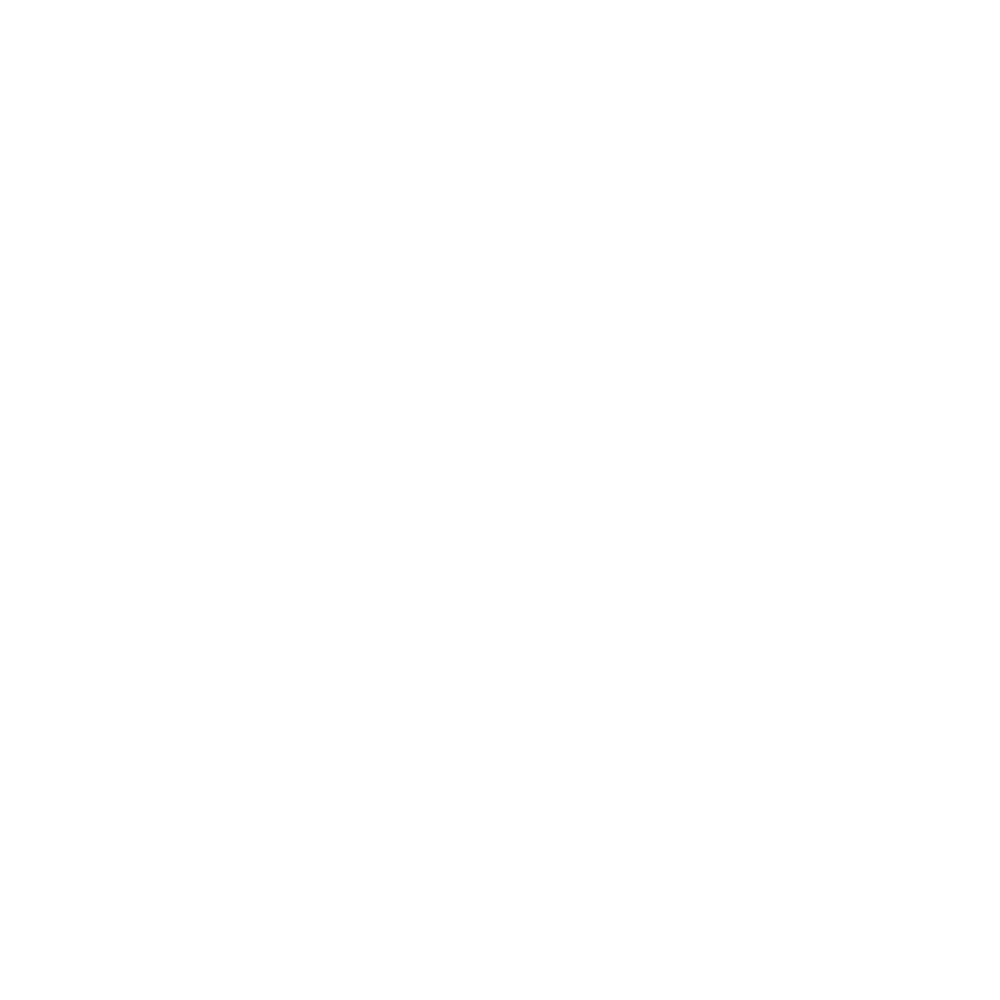

In [86]:
url = 'https://housing.com/rent/flats-for-rent-in-ahmedabad-gujarat-P4hkd3fsj8fd9kanb'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [87]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [88]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [89]:
# Scrapping urls of all products
url_list10 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list10.append(i.get_attribute("href"))  
    time.sleep(5)

In [90]:
len(url_list10)

328

In [91]:
address = []
city = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list10:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [92]:
df10 = pd.DataFrame({
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df10)
print("data scrapping complete")
df10.to_csv("df10.csv",index=False)

                                               Address       City  \
0                      Orchid Legacy, Shela, Ahmedabad  Ahmedabad   
1                     Swati Parkside, Shela, Ahmedabad  Ahmedabad   
2               Vraj heights, Prahlad Nagar, Ahmedabad  Ahmedabad   
3    Adani The Meadows, Vaishno Devi Circle, Ahmedabad  Ahmedabad   
4                        R R Solution, Gota, Ahmedabad  Ahmedabad   
..                                                 ...        ...   
323  Godrej Pinecrest Apartments, Nigam Nagar, Chan...  Ahmedabad   
324                                   Shela, Ahmedabad  Ahmedabad   
325          Praharsh Highland, South Bopal, Ahmedabad  Ahmedabad   
326            Goyal Green Park, Shantipura, Ahmedabad  Ahmedabad   
327                Praharsh Highland, Bopal, Ahmedabad  Ahmedabad   

    Rental Price No of Bathrooms  Area Cupboard           Balcony Geyser  \
0         45,000               1  2623        -     Available now      -   
1       1,30,000   

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/5d099eb401c3483cc7491af38f226bac/v0/medium/2_bhk_apartment-for-rent-khoni_pagadyacha_pada-Thane-bedroom_two.jpg" as="image"/><link re
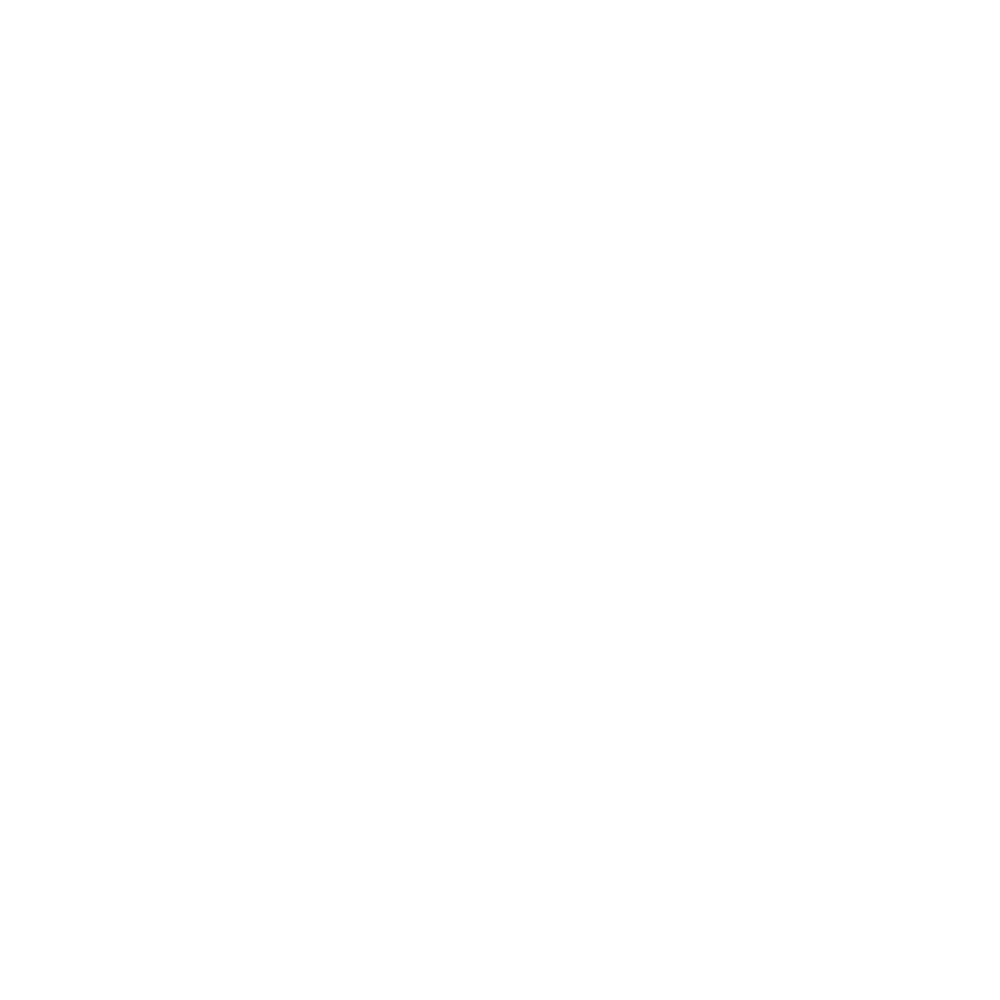

In [93]:
url = 'https://housing.com/rent/flats-for-rent-in-thane-maharashtra-Plqq7bm2s53fechd'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [94]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [95]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [96]:
# Scrapping urls of all products
url_list11 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list11.append(i.get_attribute("href"))  
    time.sleep(5)

In [97]:
len(url_list11)

300

In [98]:
address = []
city = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list11:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [99]:
df11 = pd.DataFrame({
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df11)
print("data scrapping complete")
df11.to_csv("df11.csv",index=False)

                                               Address   City Rental Price  \
0    Lodha Lakeshore Greens, Palava Lakeshore Green...  Thane       11,000   
1    Lodha Casa Rio, Palava Phase 1, Palava Phase 1...  Thane       17,000   
2         Lodha Palava Lakeside A To H, Antarli, Thane  Thane       12,500   
3         Lodha Palava Lakeshore Green, Antarli, Thane  Thane       32,000   
4    Cosmos Empress Park, Kasarvadavali, Thane West...  Thane       24,000   
..                                                 ...    ...          ...   
295                         Naupada, Thane West, Thane  Thane       26,000   
296                          Hiranandani Estate, Thane  Thane       70,000   
297             Ashar Edge, Manpada, Thane West, Thane  Thane       40,000   
298                 Sagarli Gaon, Dombivli East, Thane  Thane       10,600   
299  Tata Serein Phase 1, Pawar Nagar, Thane West, ...  Thane       45,000   

    No of Bathrooms  Area Cupboard        Balcony Geyser Fridge

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/a97398b1d20f372007f0fc9f21124584/v0/medium/2_bhk_apartment-for-rent-greater_khanda-Navi+Mumbai-hall.jpg" as="image"/><link rel="prelo
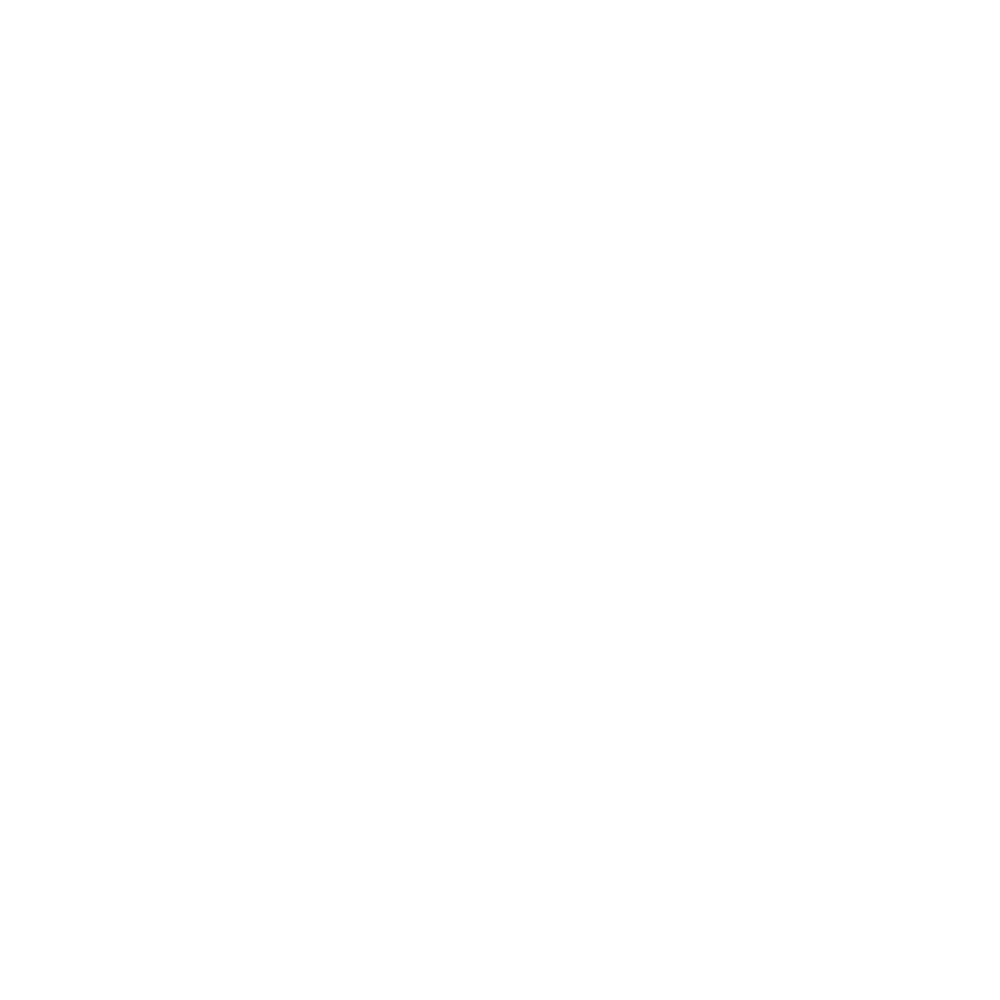

In [100]:
url = 'https://housing.com/rent/flats-for-rent-in-navi-mumbai-maharashtra-P1eij1jtclmvaoj9w'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [101]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [102]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [103]:
# Scrapping urls of all products
url_list12 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list12.append(i.get_attribute("href"))  
    time.sleep(5)

In [104]:
len(url_list12)

330

In [105]:
address = []
city = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list12:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [106]:
df12 = pd.DataFrame({
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df12)
print("data scrapping complete")
df12.to_csv("df12.csv",index=False)

                                               Address         City  \
0           Khanda Colony, Greater Khanda, Navi Mumbai  Navi Mumbai   
1                                Ghansoli, Navi Mumbai  Navi Mumbai   
2    Progressive Sea Lounge, Sector 15, Belapur CBD...  Navi Mumbai   
3         West End CHS, Sector 19A, Nerul, Navi Mumbai  Navi Mumbai   
4          Shagoofa, Sector 58A, Seawoods, Navi Mumbai  Navi Mumbai   
..                                                 ...          ...   
325  Neelkanth Alpine, Jijamata Nagar, Sector 6, Gh...  Navi Mumbai   
326                   sector 5 ulwe, Ulwe, Navi Mumbai  Navi Mumbai   
327  Millennium avinash, Sector-19, Airoli, Navi Mu...  Navi Mumbai   
328                    Sector-5, Kharghar, Navi Mumbai  Navi Mumbai   
329        Apsara villa, Sector 12, Vashi, Navi Mumbai  Navi Mumbai   

    Rental Price No of Bathrooms  Area Cupboard        Balcony Geyser Fridge  \
0         20,000               3  1055        -  Available now     

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/7be926b4ce0c3ce42c82d74effd5bfb6/v0/medium/4_bhk_independent_builder_floor-for-rent-green_field_colony_1-Faridabad-bedroom_four.jpg" 
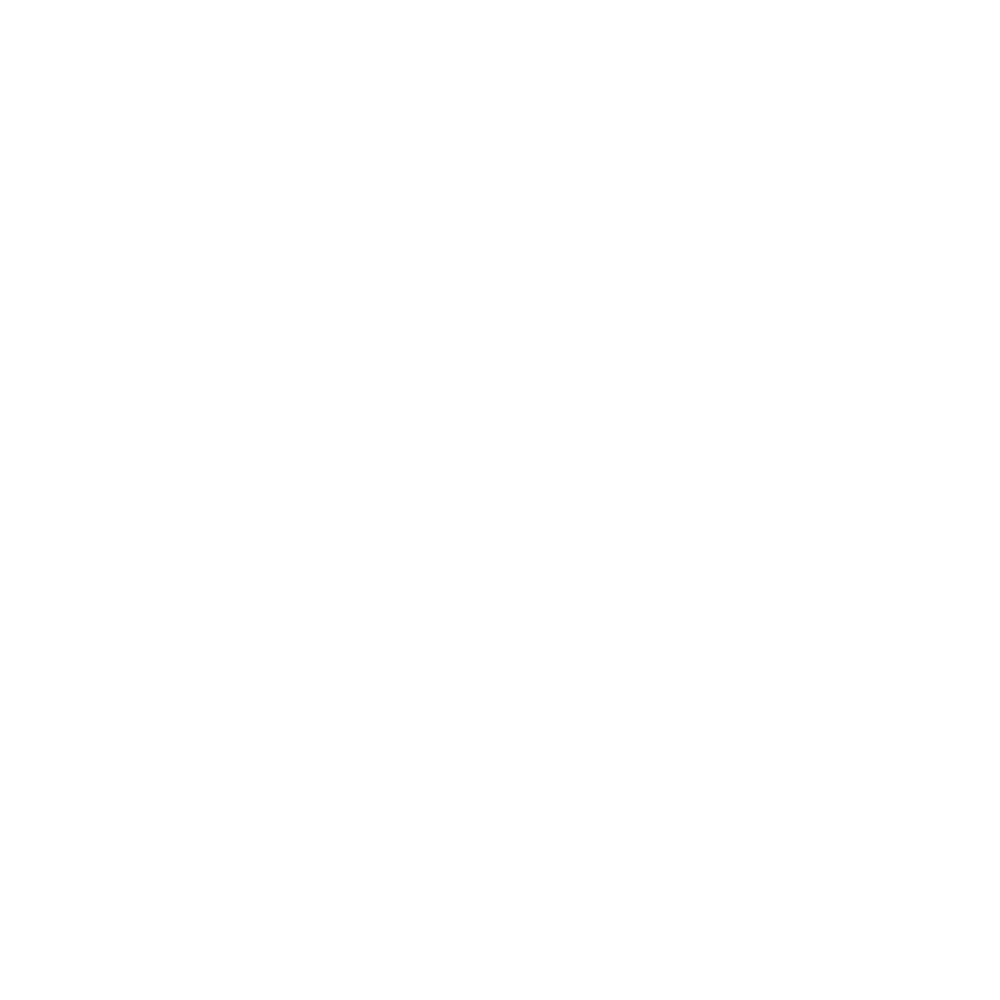

In [107]:
url = 'https://housing.com/rent/flats-for-rent-in-faridabad-haryana-P3nlekdze1dlp2923'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [108]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [109]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [110]:
# Scrapping urls of all products
url_list13 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list13.append(i.get_attribute("href"))  
    time.sleep(5)

In [111]:
len(url_list13)

310

In [112]:
address = []
city = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list13:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [113]:
df13 = pd.DataFrame({
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df13)
print("data scrapping complete")
df13.to_csv("df13.csv",index=False)

                                               Address       City  \
0             Sector 42, Green Field Colony, Faridabad  Faridabad   
1                                 Sector 35, Faridabad  Faridabad   
2              Puri Aanand Vilas, Sector 81, Faridabad  Faridabad   
3              Puri Aanand Vilas, Sector 81, Faridabad  Faridabad   
4           BPTP Parklands Pride, Sector 77, Faridabad  Faridabad   
..                                                 ...        ...   
305    Emerald Heights, RPS City, Sector 88, Faridabad  Faridabad   
306  Puri Vip Floors Sector 81 Faridabad, Sector 81...  Faridabad   
307  S3 Buildwell Floridaa Affordable Housing, Sect...  Faridabad   
308                 BPTP Park 81, Sector 81, Faridabad  Faridabad   
309         KLJ Platinum Heights, Sector 77, Faridabad  Faridabad   

    Rental Price No of Bathrooms  Area Cupboard        Balcony Geyser Fridge  \
0         30,000               4  2430        -              2      -      -   
1         2

<!doctype html><html lang="en" prefix="og: http://ogp.me/ns# website: http://ogp.me/ns/website#"><head><link rel="preconnect" href="//c.housingcdn.com"/><link rel="preconnect" href="//is1-3.housingcdn.com"/><link rel="preconnect" href="//eventrouter.housing.com"/><link rel="preconnect" href="//img.youtube.com"/><link rel="preconnect" href="//is1-2.housingcdn.com"/><meta http-equiv="origin-trial" content="AsgGWjPX2xx12aBpNxa8enFVy/0d/Ghc/GLjQO1gdmgn6eayydZJK0TGTifjIngm+7B4rWjfgVoyHZFbeKq0pg4AAABgeyJvcmlnaW4iOiJodHRwczovL2hvdXNpbmcuY29tOjQ0MyIsImZlYXR1cmUiOiJXYWtlTG9jayIsImV4cGlyeSI6MTU5MTA5NTk2MSwiaXNTdWJkb21haW4iOnRydWV9"/><meta name="referrer" content="no-referrer-when-downgrade"/><link rel="prefetch" href="//c.housingcdn.com/demand/s/client/common/assets/loader.fd27d2ce.svg" as="image"/><link rel="preload" href="https://housing-images.n7net.in/01c16c28/7703e96e8b2d7572e9b19face338c49e/v0/medium/2_bhk_apartment-for-rent-pandav_nagar_ghaziabad-Ghaziabad-kitchen.jpg" as="image"/><link r
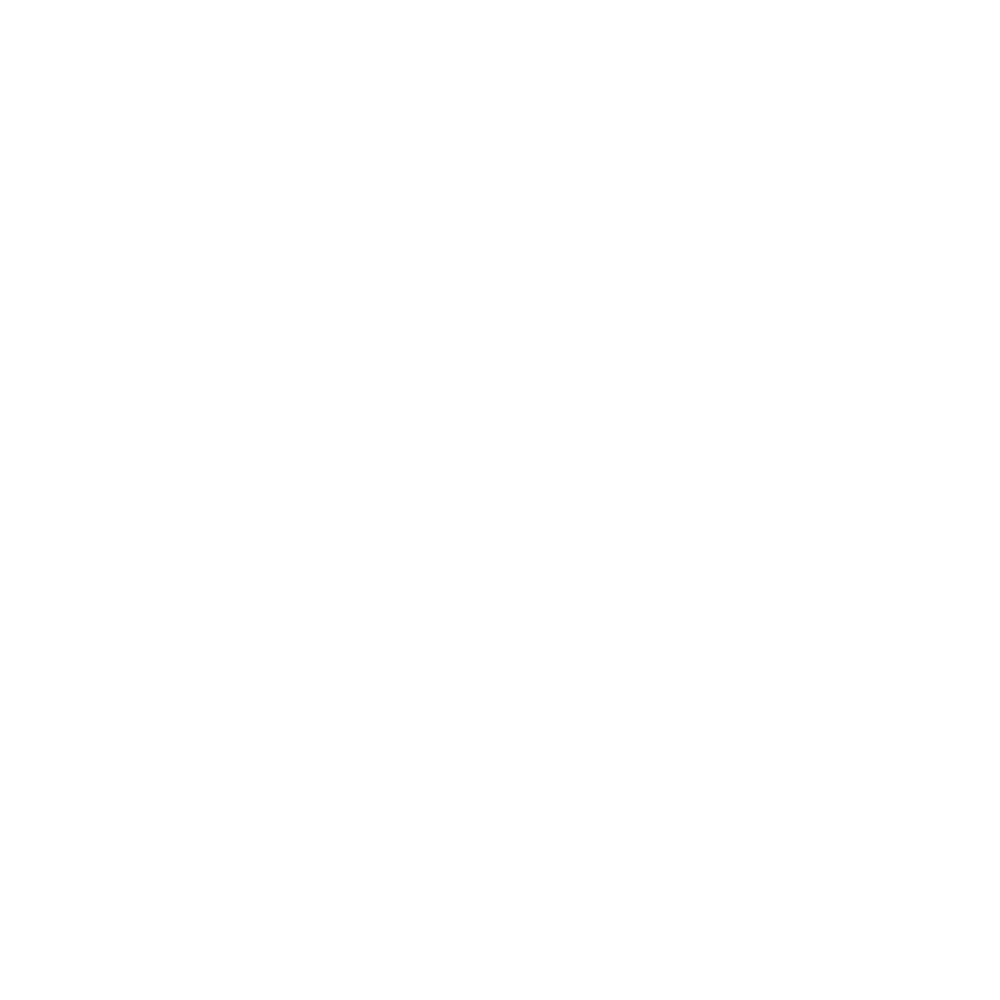

In [114]:
url = 'https://housing.com/rent/flats-for-rent-in-ghaziabad-uttar-pradesh-P6wujpumuv5tkcmbj'
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/121.0.0.0 Safari/537.36'
}

result = requests.get(url, headers=headers)
print(result.content.decode())

In [115]:
path = 'C:/Users/hp/Downloads/chromedriver-win64/chromedriver-win64/chromedriver.exe'

s = Service(path)
driver = webdriver.Chrome(service=s)

driver.get(url)
time.sleep(5)

In [116]:
for _ in range(10):
    height = driver.execute_script("return document.body.scrollHeight")
    while True:
        driver.execute_script("window.scrollTo(0,document.body.scrollHeight)")
        time.sleep(5)
        new_height = driver.execute_script("return document.body.scrollHeight")
        if height == new_height:
            break
        height = new_height

    try:
        # Waiting for the button to be present
        load_more = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.XPATH, '//button[@class="_4b1994 _2d1994 _csbfng _5jftgi _vy1wug _e21ylp _j9qr11ef _1yfe11ef _xvuoe25i _1vt4glyw _1q73uea4 _9jtlke _7lu67f _g31f4h _c8dlk8 _3f1szm _l8t4so _26oii0 cta"]'))
        )
        # Clicking the button using JavaScript to handle potential intercept issues
        driver.execute_script("arguments[0].click();", load_more)
    except ElementClickInterceptedException:
        print("ElementClickInterceptedException: Trying to click using JavaScript")
        # Retrying clicking using JavaScript
        driver.execute_script("arguments[0].click();", load_more)
    except Exception as e:
        print(f"Error: {e}")
        break  

In [117]:
# Scrapping urls of all products
url_list14 = []
url=driver.find_elements(By.XPATH, '//a[@class="_csbfng _c8dlk8 _frwh2y _ll6yew _1q73uea4 _ks15vq _vv1q9c _sq1l2s"]') 
for i in url: 
    url_list14.append(i.get_attribute("href"))  
    time.sleep(5)

In [118]:
len(url_list14)

330

In [119]:
address = []
city = []
rental_price = []
cupboard = []
bathrooms = []
area = []
balcony = []
geyser = []
fridge = []
pet = []
parking = []

for url in url_list14:
    driver.get(url)
    time.sleep(2)

    try:
        addresses = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]')
        address.append(addresses.text)
        
    except NoSuchElementException:
        address.append("-")
        
    try:
        cities = driver.find_element(By.XPATH, '//div[@class="css-1ty5xzi"]').text.split(',')[-1].strip()
        city.append(cities)
        
    except NoSuchElementException:
        city.append("-")
    
    try:
        project = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[1]')
        project_name.append(project.text)
        
    except NoSuchElementException:
        project_name.append("-")
        
        
    try:
        rental_price_element = driver.find_element(By.XPATH, '//span[@class="css-gg3jj9"]')
        rental_price.append(rental_price_element.text)
    except NoSuchElementException:
        rental_price.append("-")

        
    try:
        cupboards = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[2]')
        cupboard.append(cupboards.text)
        
    except NoSuchElementException:
        cupboard.append("-")
        
    try:
        bathroom = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[6]')
        bathrooms.append(bathroom.text)
        
    except NoSuchElementException:
        bathrooms.append("-")
        
    try:
        areas = driver.find_element(By.XPATH, '(//span[@class="css-gkudnx"])[2]').text.split(' ')[0].strip()
        area.append(areas)
        
    except NoSuchElementException:
        area.append("-")
    
    try:
        balc = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[7]')
        balcony.append(balc.text)
        
    except NoSuchElementException:
        balcony.append("-")
    
    try:
        geysers = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[3]')
        geyser.append(geysers.text)
        
    except NoSuchElementException:
        geyser.append("-")
        
    try:
        fri = driver.find_element(By.XPATH, '(//div[@class="_1q731trj _6w1e54 _9scj1k _fycs5v _ks15vq _c81fwx _h3ftgi label"])[1]')
        fridge.append(fri.text)
        
    except NoSuchElementException:
        fridge.append("-")
        
    try:
        pets = driver.find_element(By.XPATH, '(//div[@class="icon ixvzd82 _bof914e6 _lzn01ofs _an5s1crd _1ole10yn _1vbw1tcg _1y0k1tcg _du7p1o8l"])[5]')
        pet.append(pets.text)
        
    except NoSuchElementException:
        pet.append("-")
        
    try:
        park = driver.find_element(By.XPATH, '(//div[@class="_h3i2wt"])[11]')
        parking.append(park.text)
        
    except NoSuchElementException:
        parking.append("-")
        
    

In [120]:
df14 = pd.DataFrame({
    "Address" : address,
    "City" : city,
    "Rental Price" : rental_price,
    "No of Bathrooms" : bathrooms,
    "Area" : area,
    "Cupboard" : cupboard,
    "Area" : area,
    "Balcony" : balcony,
    "Geyser" : geyser,
    "Fridge" : fridge,
    "Pet" : pet,
    "Parking" : parking

})

print(df14)
print("data scrapping complete")
df14.to_csv("df13.csv",index=False)

                                               Address       City  \
0    LandCraft Golflinks Apartments, Pandav Nagar, ...  Ghaziabad   
1    Landcraft Golf Links Phase 2, Pandav Nagar, Gh...  Ghaziabad   
2    Amarpali golf home, Sain Vihar, Crossings Repu...  Ghaziabad   
3                      Sector 1, Vasundhara, Ghaziabad  Ghaziabad   
4      Prateek Grand City , Siddharth Vihar, Ghaziabad  Ghaziabad   
..                                                 ...        ...   
325           Yusufpur, Nai Basti Dundahera, Ghaziabad  Ghaziabad   
326                   Sector 15, Vasundhara, Ghaziabad  Ghaziabad   
327    Prateek Grand City , Siddharth Vihar, Ghaziabad  Ghaziabad   
328  Apex The Kremlin, Christian Nagar, Nai Basti D...  Ghaziabad   
329                    Sector 5, Vasundhara, Ghaziabad  Ghaziabad   

    Rental Price No of Bathrooms  Area Cupboard        Balcony Geyser Fridge  \
0         16,000               2  1135        -              3      -      -   
1         1

In [121]:
dataframes = [df1, df2, df3, df4]
column_to_delete = "Project Name"

for df in dataframes:
    if column_to_delete in df.columns:
        df.drop(column_to_delete, axis=1, inplace=True)


In [122]:
df_list = [df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11, df12, df13, df14]

# Concatenating the dataframes along the rows
df = pd.concat(df_list, ignore_index=True)
print(df)
df.to_csv("Capstone DataFrame.csv", index=False)
print("Web Scrapping for Capstone Project is Complete")

                                                Address       City  \
0              Kuvar House , Azad Nagar, Colaba, Mumbai     Mumbai   
1     Sethia Grandeur, Siddharth Nagar, Bandra East,...     Mumbai   
2     Pebbles Marina Apartments, Juhu Koliwada, Khar...     Mumbai   
3           Lodha Venezia, Krishna Nagar, Parel, Mumbai     Mumbai   
4     Lokhandwala Minerva Mahalaxmi, Royal Western I...     Mumbai   
...                                                 ...        ...   
5128           Yusufpur, Nai Basti Dundahera, Ghaziabad  Ghaziabad   
5129                   Sector 15, Vasundhara, Ghaziabad  Ghaziabad   
5130    Prateek Grand City , Siddharth Vihar, Ghaziabad  Ghaziabad   
5131  Apex The Kremlin, Christian Nagar, Nai Basti D...  Ghaziabad   
5132                    Sector 5, Vasundhara, Ghaziabad  Ghaziabad   

     Rental Price No of Bathrooms  Area Cupboard        Balcony Geyser Fridge  \
0        1,00,000               1   800        -     No Balcony      -      - 